# CLUSTERING EMBEDDINGS 

Questo notebook esegue il clustering di embedding (derivati dall'uso di un encoder) usando l'algoritmo DBSCAN, con e senza riduzione della dimensionalità.


In [ ]:
!pip install umap-learn

In [ ]:
#################################
# Importazione pacchetti di base
#################################
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import DBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import silhouette_score
from sklearn.decomposition import PCA
from sklearn.model_selection import ParameterGrid
import plotly.express as px
import plotly.graph_objects as go
from tqdm.notebook import tqdm
import umap

2025-05-20 12:02:52.398568: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1747742572.624467      13 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1747742572.688045      13 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [ ]:
PATH_DATASET_WSLIDINGW = "/kaggle/input/math-dataset-embedded-final/file_con_embeddings_con_sliding_windows.parquet"
PATH_DATASET_WTSLIDINGW = "/kaggle/input/math-dataset-embedded-final/file_con_embeddings_senza_sliding_windows (1).parquet"

In [ ]:
###########################################
# Funzione utilità
##########################################
def load_and_prepare_data(filepath):
    print(f"Caricamento dati da {filepath}...")
    df = pd.read_parquet(filepath)
    print(f"Dimensioni del dataset: {df.shape}")
    
    print("\nPrime righe del dataset:")
    print(df.head(2))
    
    print("\nInformazioni sulle colonne:")
    print(df.info())
    
    print("\nStatistiche descrittive:")
    print(df.describe())
    
    print("\nValori mancanti per colonna:")
    print(df.isnull().sum())
    
    embeddings = np.array(df['embedding'].tolist())
    print(f"\nDimensione degli embedding: {embeddings.shape}")
    
    return df, embeddings


def visualize_embeddings(embeddings, title, annotate=False, max_annotate=100):

    # === PCA ===
    print(f"\n[Riduzione PCA] - {title}...")
    pca = PCA(n_components=2)
    embedding_pca = pca.fit_transform(embeddings)
    var_explained = np.sum(pca.explained_variance_ratio_)
    print(f"Varianza spiegata da PCA (2 componenti): {var_explained:.2%}")

    plt.figure(figsize=(12, 9))
    plt.scatter(
        embedding_pca[:, 0], embedding_pca[:, 1],
        alpha=0.7,
        s=40,
        c='cornflowerblue',
        edgecolors='k',
        linewidths=0.2
    )
    plt.title(f"PCA 2D degli Embedding - {title}\nVarianza spiegata: {var_explained:.2%}",
              fontsize=18, fontweight='bold')
    plt.xlabel('Componente Principale 1', fontsize=14)
    plt.ylabel('Componente Principale 2', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    if annotate:
        print(f"Aggiunta annotazioni PCA per i primi {min(len(embedding_pca), max_annotate)} punti...")
        for i in range(min(len(embedding_pca), max_annotate)):
            plt.annotate(str(i), (embedding_pca[i, 0], embedding_pca[i, 1]),
                         fontsize=8, alpha=0.6, textcoords="offset points", xytext=(0, 5), ha='center')

    plt.tight_layout()
    plt.show()

    # === UMAP ===
    print(f"\n[Riduzione UMAP] - {title}...")
    reducer = umap.UMAP(n_components=2, random_state=42)
    embedding_umap = reducer.fit_transform(embeddings)

    plt.figure(figsize=(12, 9))
    plt.scatter(
        embedding_umap[:, 0], embedding_umap[:, 1],
        alpha=0.7,
        s=40,
        c='mediumseagreen',
        edgecolors='k',
        linewidths=0.2
    )
    plt.title(f"UMAP 2D degli Embedding - {title}",
              fontsize=18, fontweight='bold')
    plt.xlabel('Componente UMAP 1', fontsize=14)
    plt.ylabel('Componente UMAP 2', fontsize=14)
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)

    if annotate:
        print(f"Aggiunta annotazioni UMAP per i primi {min(len(embedding_umap), max_annotate)} punti...")
        for i in range(min(len(embedding_umap), max_annotate)):
            plt.annotate(str(i), (embedding_umap[i, 0], embedding_umap[i, 1]),
                         fontsize=8, alpha=0.6, textcoords="offset points", xytext=(0, 5), ha='center')

    plt.tight_layout()
    plt.show()



def grid_search_dbscan(embeddings, eps_range, min_samples_range):
    print("\nEsecuzione Grid Search per DBSCAN...")
    
    # Normalizziamo i dati per DBSCAN
    scaler = StandardScaler()
    embeddings_scaled = scaler.fit_transform(embeddings)
    
    # Creiamo il grid di parametri
    param_grid = ParameterGrid({
        'eps': eps_range,
        'min_samples': min_samples_range
    })
    
    results = []
    
    for params in tqdm(param_grid):
        dbscan = DBSCAN(eps=params['eps'], min_samples=params['min_samples'])
        labels = dbscan.fit_predict(embeddings_scaled)
        
        # Contiamo il numero di cluster (escludendo il rumore, etichettato con -1)
        n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
        noise_proportion = np.sum(labels == -1) / len(labels)
        
        # Calcoliamo il silhouette score se abbiamo più di un cluster e non tutti i punti sono rumore
        if n_clusters > 1 and noise_proportion < 1.0:
            try:
                # Escludiamo i punti di rumore per il calcolo del silhouette score
                non_noise_indices = labels != -1
                if np.sum(non_noise_indices) > 1:
                    silhouette = silhouette_score(
                        embeddings_scaled[non_noise_indices], 
                        labels[non_noise_indices]
                    )
                else:
                    silhouette = float('nan')
            except:
                silhouette = float('nan')
        else:
            silhouette = float('nan')
        
        results.append({
            'eps': params['eps'],
            'min_samples': params['min_samples'],
            'n_clusters': n_clusters,
            'noise_proportion': noise_proportion,
            'silhouette': silhouette
        })
    
    results_df = pd.DataFrame(results)
    print("\nRisultati della Grid Search:")
    print(results_df.sort_values(by='silhouette', ascending=False).head(10))
    
    # Troviamo i parametri migliori (massimo silhouette score, escludendo NaN)
    valid_results = results_df[~results_df['silhouette'].isna()]
    if len(valid_results) > 0:
        best_params = valid_results.loc[valid_results['silhouette'].idxmax()]
        print(f"\nMigliori parametri: eps={best_params['eps']}, min_samples={best_params['min_samples']}")
        print(f"Numero di cluster: {best_params['n_clusters']}")
        print(f"Proporzione di rumore: {best_params['noise_proportion']:.2%}")
        print(f"Silhouette score: {best_params['silhouette']:.4f}")
    else:
        print("\nNessun parametro valido trovato. Utilizziamo parametri predefiniti.")
        best_params = {'eps': 0.5, 'min_samples': 5}
    
    return results_df, best_params, scaler

def visualize_clusters(embedding_2d, labels, title):
    df_plot = pd.DataFrame({
        'x': embedding_2d[:, 0],
        'y': embedding_2d[:, 1],
        'cluster': labels
    })

    # Etichettatura cluster con conteggio punti
    cluster_counts = df_plot['cluster'].value_counts().sort_index()
    df_plot['cluster_label'] = df_plot['cluster'].apply(
        lambda x: 'Rumore' if x == -1 else f'Cluster {x} ({cluster_counts[x]})'
    )

    # Definiamo la palette
    n_clusters = df_plot['cluster'].nunique()
    base_palette = sns.color_palette('tab10') if n_clusters <= 10 else sns.color_palette('husl', n_clusters)
    palette = {label: base_palette[i % len(base_palette)] for i, label in enumerate(sorted(df_plot['cluster'].unique()))}
    palette[-1] = (0.5, 0.5, 0.5)  # Rumore in grigio

    # Visualizzazione
    plt.figure(figsize=(14, 10))
    sns.scatterplot(
        data=df_plot,
        x='x', y='y',
        hue='cluster_label',
        palette=[palette[label] for label in df_plot['cluster']],
        alpha=0.8,
        edgecolor='black',
        linewidth=0.3,
        s=60
    )
    
    plt.title(f"Clustering DBSCAN - {title}", fontsize=18, fontweight='bold', pad=15)
    plt.xlabel('Componente 1', fontsize=14)
    plt.ylabel('Componente 2', fontsize=14)
    plt.xticks(fontsize=12)
    plt.yticks(fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.5)
    plt.legend(title='Cluster (n° punti)', bbox_to_anchor=(1.05, 1), loc='upper left', fontsize=12)
    plt.tight_layout()
    plt.show()

    # Riassunto numerico
    print("\nDistribuzione dei punti nei cluster:")
    for label, count in cluster_counts.items():
        label_name = "Rumore" if label == -1 else f"Cluster {label}"
        print(f"{label_name}: {count} punti ({count/len(labels):.2%})")

def reduce_with_pca(embeddings, variance_threshold=0.90):
    pca = PCA()
    pca.fit(embeddings)

    cumulative_variance = np.cumsum(pca.explained_variance_ratio_)
    n_components = np.argmax(cumulative_variance >= variance_threshold) + 1
    print(f"Numero di componenti per mantenere il {variance_threshold*100:.0f}% della varianza: {n_components}")

    pca = PCA(n_components=n_components)
    embeddings_reduced = pca.fit_transform(embeddings)

    print(f"Forma degli embeddings ridotti: {embeddings_reduced.shape}")
    return embeddings_reduced, n_components

## # Clustering di embedding con sliding windows senza riduzione della dimensionalità

In [ ]:
df_sliding, embeddings_sliding = load_and_prepare_data(PATH_DATASET_WSLIDINGW)

Caricamento dati da /kaggle/input/math-dataset-embedded-final/file_con_embeddings_con_sliding_windows.parquet...
Dimensioni del dataset: (100000, 6)

Prime righe del dataset:
                                             problem  \
0  A company sells a liquid detergent in two diff...   
1  How many regions are created when a circle is ...   

                                  generated_solution expected_answer  \
0  To determine which bottle is the better deal, ...              25   
1  The number of regions created by the chords ca...             211   

   problem_source  problem_length  \
0  augmented_math             300   
1  augmented_math             143   

                                           embedding  
0  [-0.007559761, 0.03191987, 0.022948245, -0.049...  
1  [0.0070062503, 0.0045859125, -0.07132043, 0.01...  

Informazioni sulle colonne:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 6 columns):
 #   Column             


[Riduzione PCA] - con Sliding Windows...
Varianza spiegata da PCA (2 componenti): 10.96%


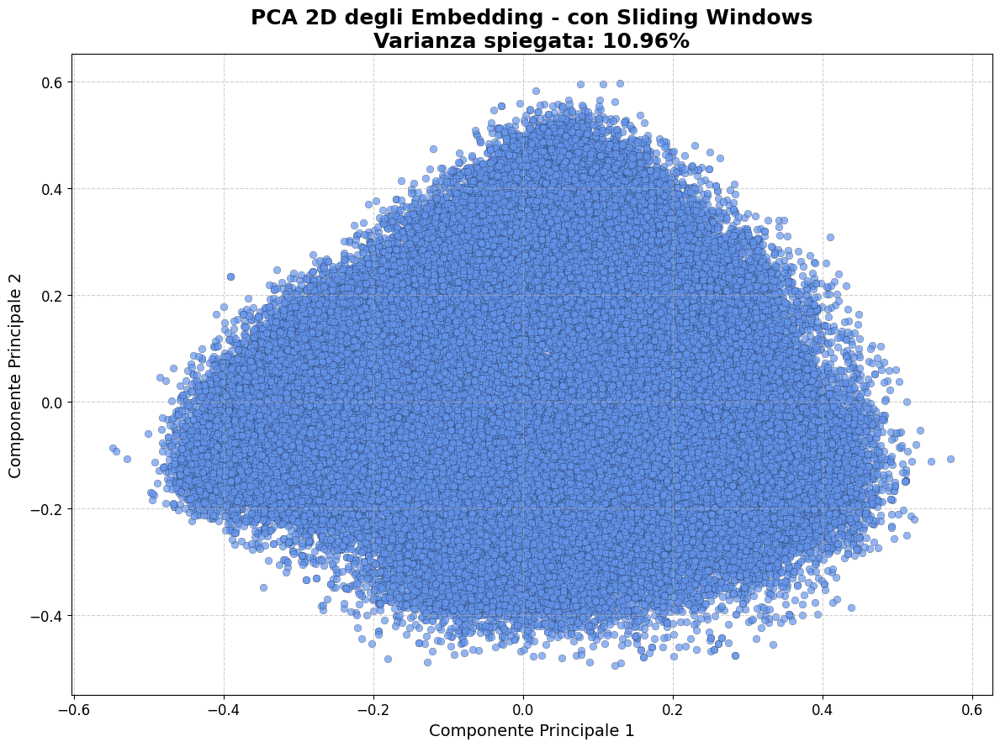


[Riduzione UMAP] - con Sliding Windows...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


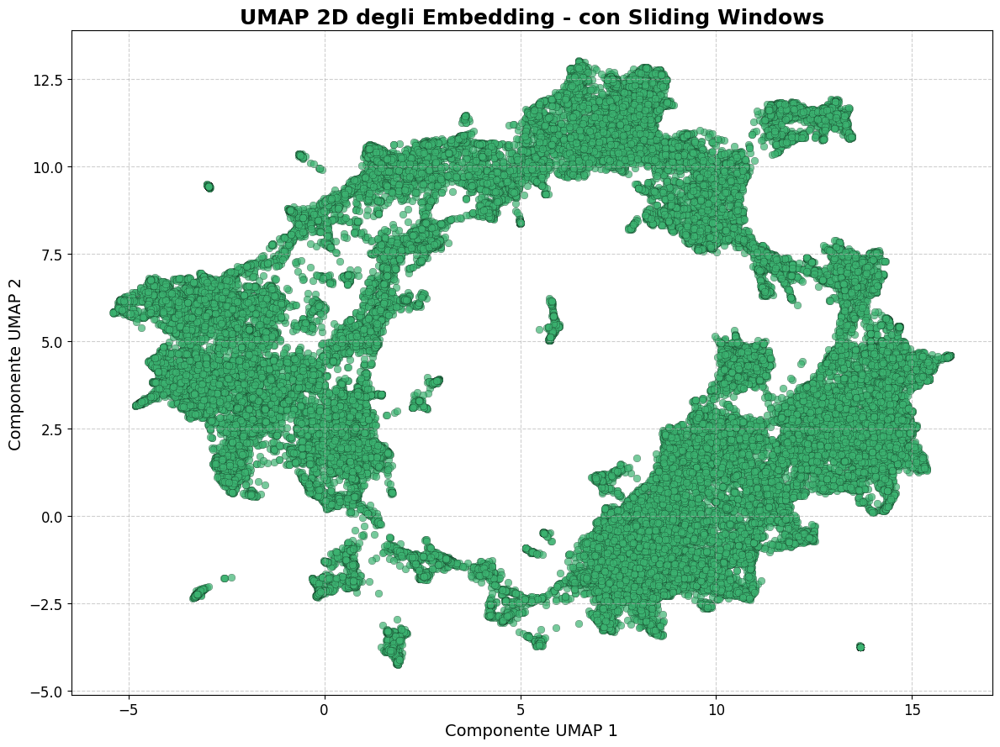

In [ ]:
visualize_embeddings(embeddings_sliding, "con Sliding Windows")


Esecuzione Grid Search per DBSCAN...


  0%|          | 0/15 [00:00<?, ?it/s]


Risultati della Grid Search:
   eps  min_samples  n_clusters  noise_proportion  silhouette
0  0.1            5           0               1.0         NaN
1  0.1           25           0               1.0         NaN
2  0.1           50           0               1.0         NaN
3  0.1           70           0               1.0         NaN
4  0.1          100           0               1.0         NaN
5  0.7            5           0               1.0         NaN
6  0.7           25           0               1.0         NaN
7  0.7           50           0               1.0         NaN
8  0.7           70           0               1.0         NaN
9  0.7          100           0               1.0         NaN

Nessun parametro valido trovato. Utilizziamo parametri predefiniti.


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/tmp/ipykernel_13/2691697294.py:182: UserWarning: The palette list has more values (100000) than needed (1), which may not be intended.
  sns.scatterplot(


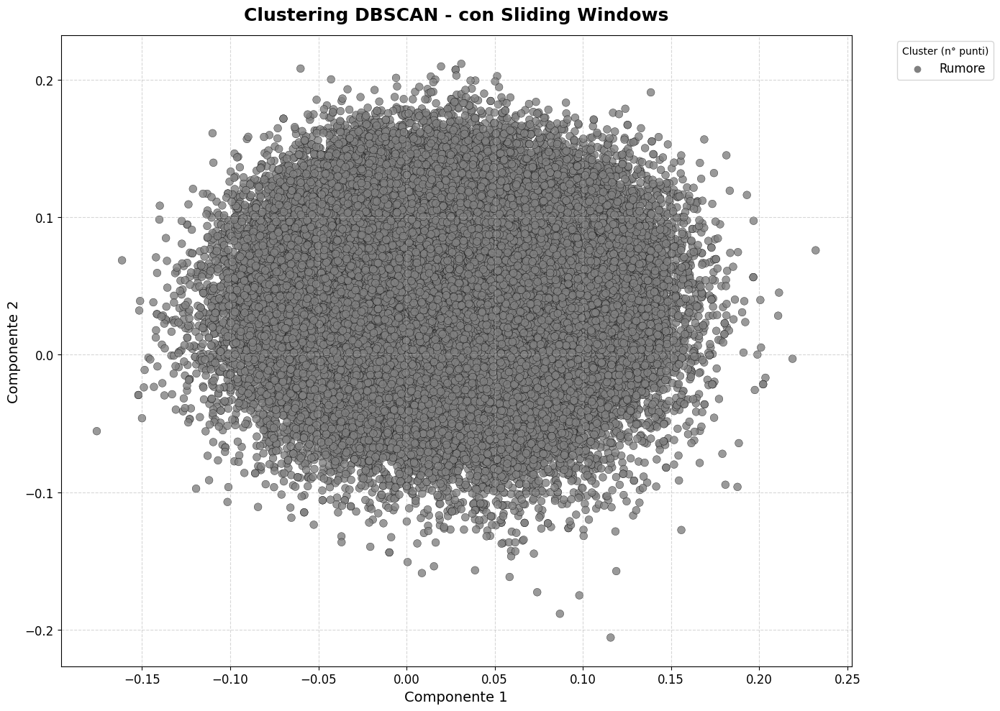


Distribuzione dei punti nei cluster:
Rumore: 100000 punti (100.00%)


In [ ]:
# Grid search per DBSCAN
eps_range = [0.1, 0.7, 1]
min_samples_range = [5, 25, 50, 70, 100]
    
results_sliding, best_params_sliding, scaler_sliding = grid_search_dbscan(
    embeddings_sliding, 
    eps_range,
    min_samples_range
)
    
# Applicazione di DBSCAN con i migliori parametri
dbscan_sliding = DBSCAN(
    eps=best_params_sliding['eps'], 
    min_samples=best_params_sliding['min_samples']
)
embeddings_scaled_sliding = scaler_sliding.transform(embeddings_sliding)
labels_sliding = dbscan_sliding.fit_predict(embeddings_scaled_sliding)
    
visualize_clusters(embeddings_sliding, labels_sliding, "con Sliding Windows")

## # Clustering di embedding con sliding windows e riduzione della dimensionalità

Numero di componenti per mantenere il 90% della varianza: 158
Forma degli embeddings ridotti: (100000, 158)

[Riduzione PCA] - con Sliding Windows (con PCA var 90%)...
Varianza spiegata da PCA (2 componenti): 12.19%


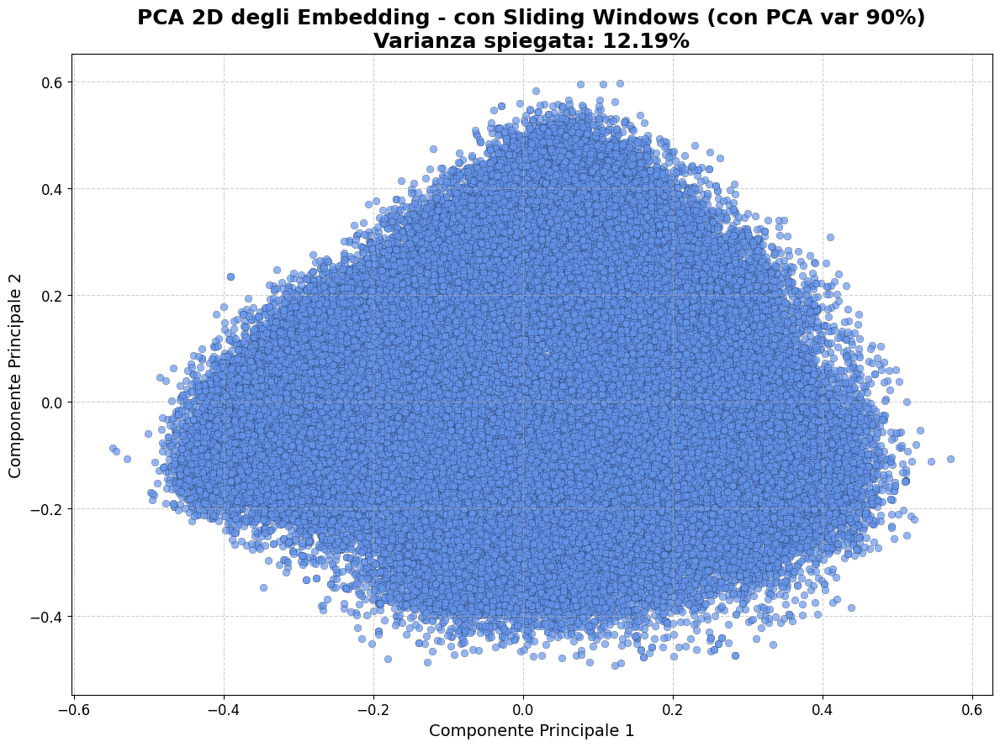


[Riduzione UMAP] - con Sliding Windows (con PCA var 90%)...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


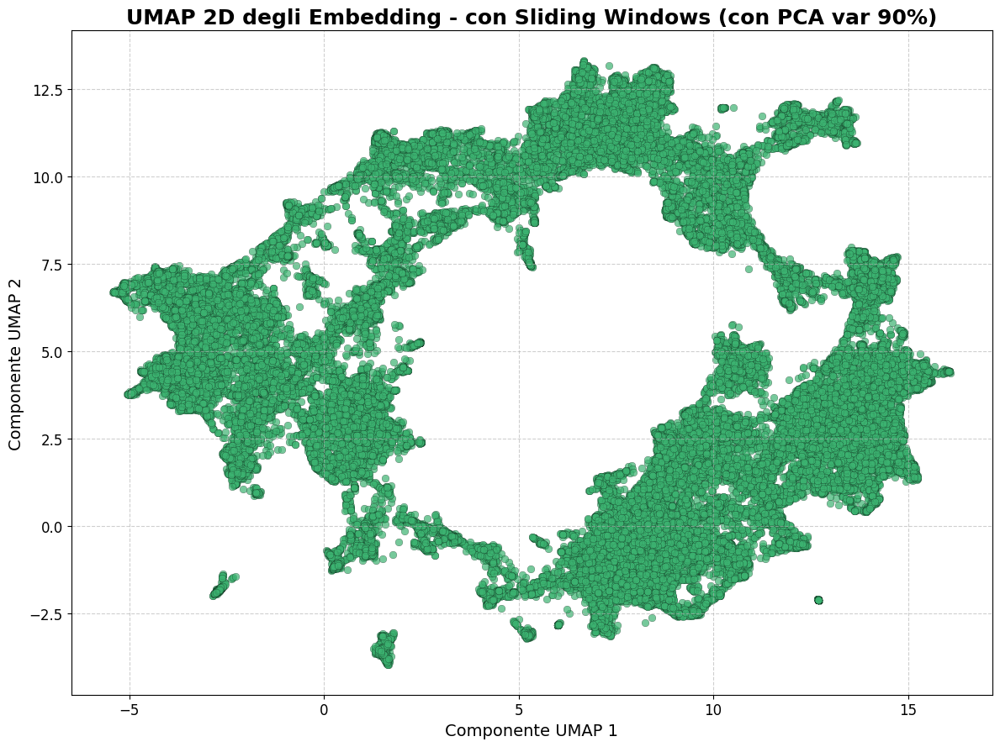

In [ ]:
embeddings_sliding_pca, n_pca_sliding = reduce_with_pca(embeddings_sliding)
visualize_embeddings(embeddings_sliding_pca, "con Sliding Windows (con PCA var 90%)")

In [ ]:
results_sliding_pca, best_params_sliding_pca, scaler_sliding_pca = grid_search_dbscan(embeddings_sliding_pca, eps_range, min_samples_range)
dbscan_sliding_pca = DBSCAN(eps=best_params_sliding_pca['eps'], min_samples=best_params_sliding_pca['min_samples'])
labels_sliding_pca = dbscan_sliding_pca.fit_predict(scaler_sliding_pca.transform(embeddings_sliding_pca))


Esecuzione Grid Search per DBSCAN...


  0%|          | 0/15 [00:00<?, ?it/s]


Risultati della Grid Search:
   eps  min_samples  n_clusters  noise_proportion  silhouette
0  0.1            5           0               1.0         NaN
1  0.1           25           0               1.0         NaN
2  0.1           50           0               1.0         NaN
3  0.1           70           0               1.0         NaN
4  0.1          100           0               1.0         NaN
5  0.7            5           0               1.0         NaN
6  0.7           25           0               1.0         NaN
7  0.7           50           0               1.0         NaN
8  0.7           70           0               1.0         NaN
9  0.7          100           0               1.0         NaN

Nessun parametro valido trovato. Utilizziamo parametri predefiniti.


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


/tmp/ipykernel_13/2691697294.py:182: UserWarning: The palette list has more values (100000) than needed (1), which may not be intended.
  sns.scatterplot(


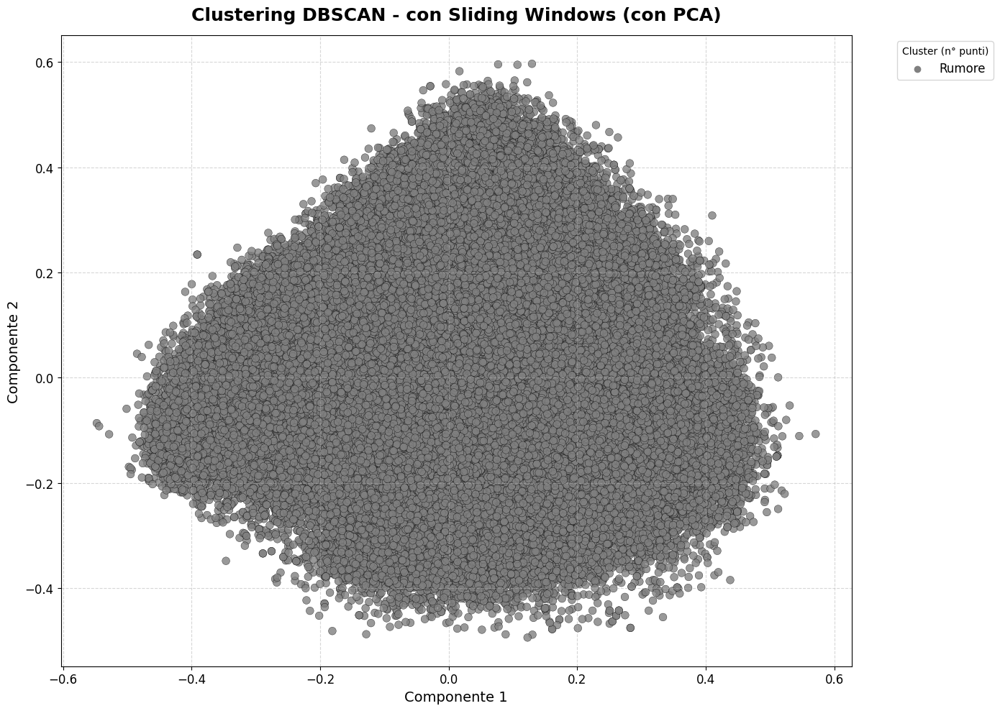


Distribuzione dei punti nei cluster:
Rumore: 100000 punti (100.00%)


In [ ]:
visualize_clusters(embeddings_sliding_pca, labels_sliding_pca, "con Sliding Windows (con PCA)")

## # Clustering di embedding senza sliding windows e senza riduzione dimensionalità

In [ ]:
df_no_sliding, embeddings_no_sliding = load_and_prepare_data(PATH_DATASET_WTSLIDINGW)

Caricamento dati da /kaggle/input/math-dataset-embedded-final/file_con_embeddings_senza_sliding_windows (1).parquet...
Dimensioni del dataset: (100000, 6)

Prime righe del dataset:
                                             problem  \
0  A company sells a liquid detergent in two diff...   
1  How many regions are created when a circle is ...   

                                  generated_solution expected_answer  \
0  To determine which bottle is the better deal, ...              25   
1  The number of regions created by the chords ca...             211   

   problem_source  problem_length  \
0  augmented_math             300   
1  augmented_math             143   

                                           embedding  
0  [-0.007559761, 0.03191987, 0.022948245, -0.049...  
1  [0.0070062503, 0.0045859125, -0.07132043, 0.01...  

Informazioni sulle colonne:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 6 columns):
 #   Column       


[Riduzione PCA] - senza Sliding Windows...
Varianza spiegata da PCA (2 componenti): 10.96%


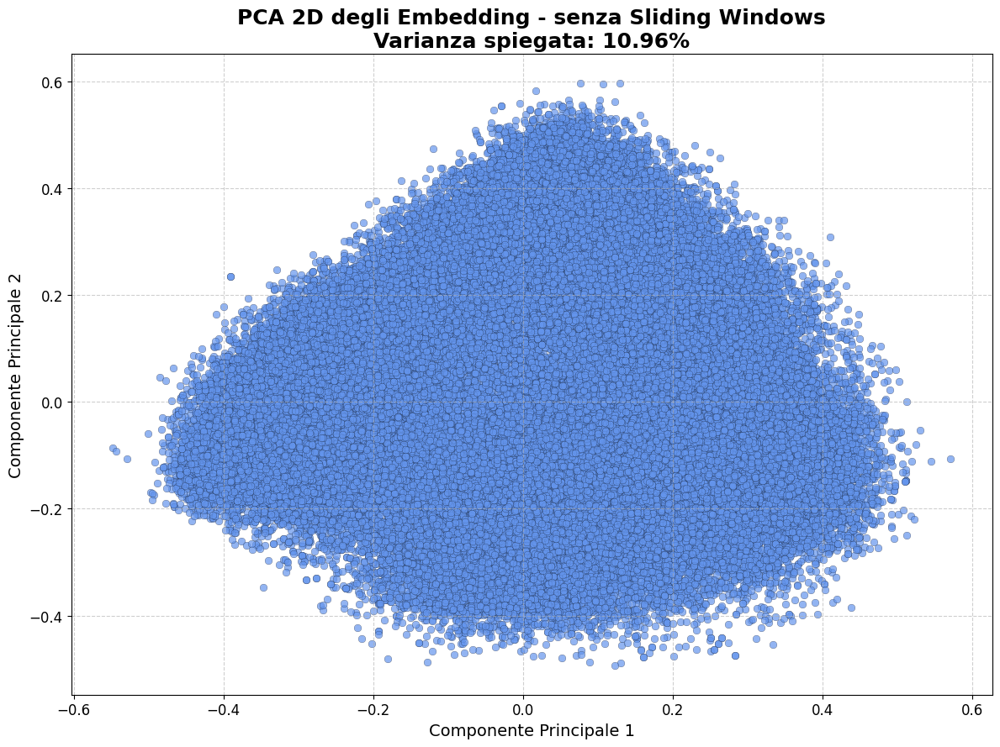


[Riduzione UMAP] - senza Sliding Windows...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


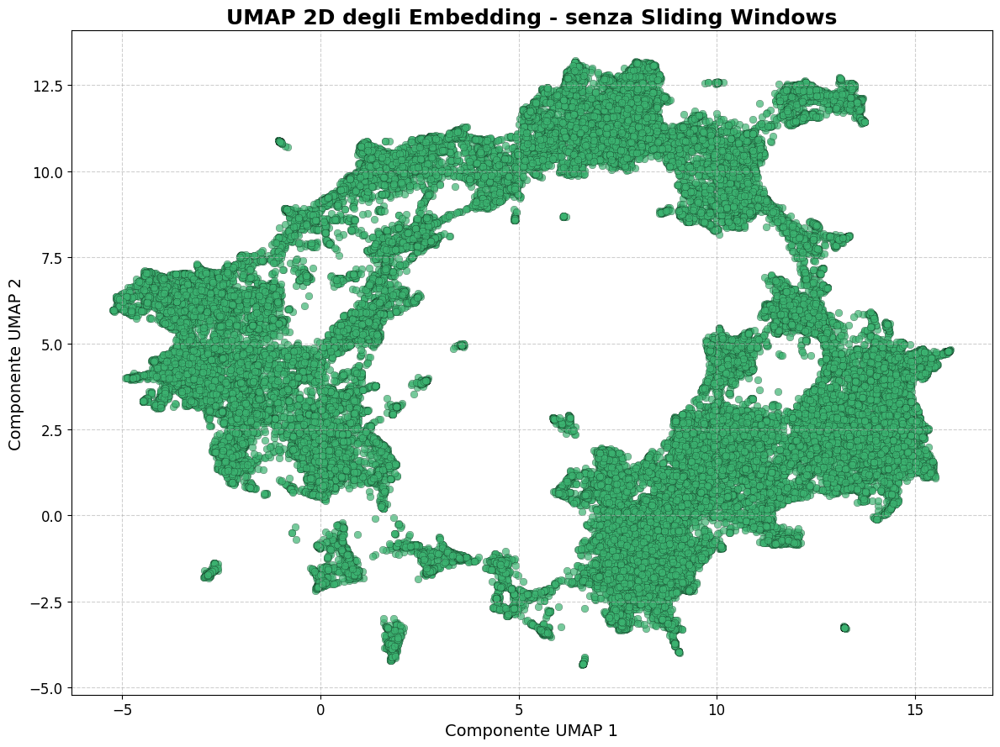

In [ ]:
visualize_embeddings(embeddings_no_sliding, "senza Sliding Windows")


Esecuzione Grid Search per DBSCAN...


  0%|          | 0/15 [00:00<?, ?it/s]


Risultati della Grid Search:
   eps  min_samples  n_clusters  noise_proportion  silhouette
0  0.1            5           0               1.0         NaN
1  0.1           25           0               1.0         NaN
2  0.1           50           0               1.0         NaN
3  0.1           70           0               1.0         NaN
4  0.1          100           0               1.0         NaN
5  0.7            5           0               1.0         NaN
6  0.7           25           0               1.0         NaN
7  0.7           50           0               1.0         NaN
8  0.7           70           0               1.0         NaN
9  0.7          100           0               1.0         NaN

Nessun parametro valido trovato. Utilizziamo parametri predefiniti.


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/tmp/ipykernel_13/2691697294.py:182: UserWarning: The palette list has more values (100000) than needed (1), which may not be intended.
  sns.scatterplot(


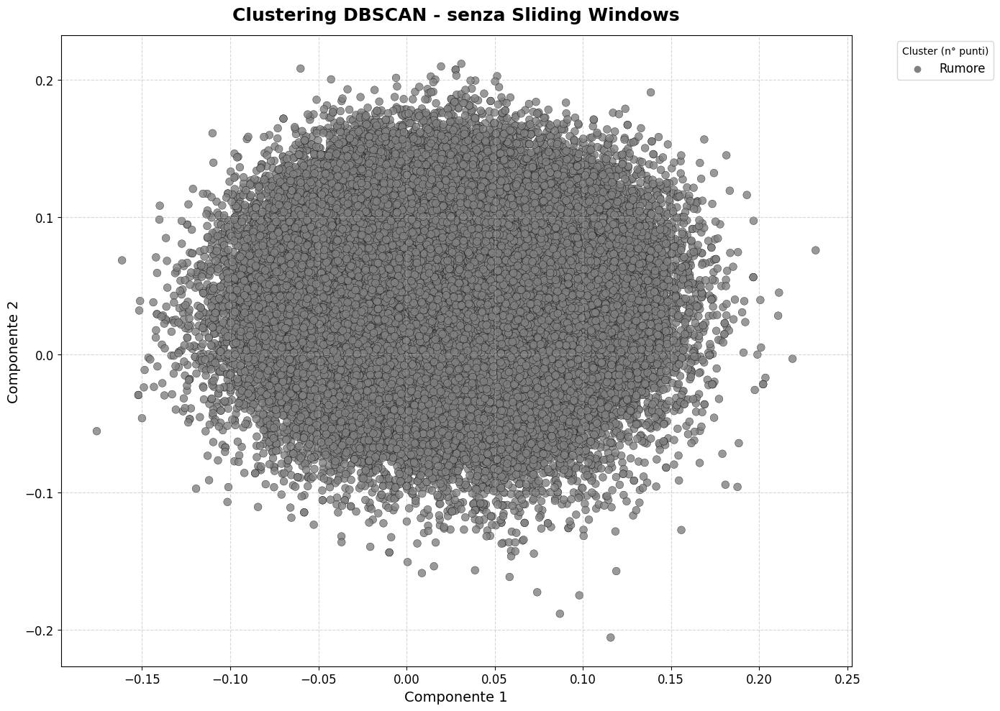


Distribuzione dei punti nei cluster:
Rumore: 100000 punti (100.00%)


In [ ]:
# Grid search per DBSCAN
results_no_sliding, best_params_no_sliding, scaler_no_sliding = grid_search_dbscan(
        embeddings_no_sliding, 
        eps_range, 
        min_samples_range
)
    
# Applicazione di DBSCAN con i migliori parametri
dbscan_no_sliding = DBSCAN(
        eps=best_params_no_sliding['eps'], 
        min_samples=best_params_no_sliding['min_samples']
)
embeddings_scaled_no_sliding = scaler_no_sliding.transform(embeddings_no_sliding)
labels_no_sliding = dbscan_no_sliding.fit_predict(embeddings_scaled_no_sliding)
    
visualize_clusters(embeddings_no_sliding, labels_no_sliding, "senza Sliding Windows")

## # Clustering di embedding senza sliding windows con riduzione dimensionalità

Numero di componenti per mantenere il 90% della varianza: 158
Forma degli embeddings ridotti: (100000, 158)

[Riduzione PCA] - senza Sliding Windows (con PCA)...
Varianza spiegata da PCA (2 componenti): 12.19%


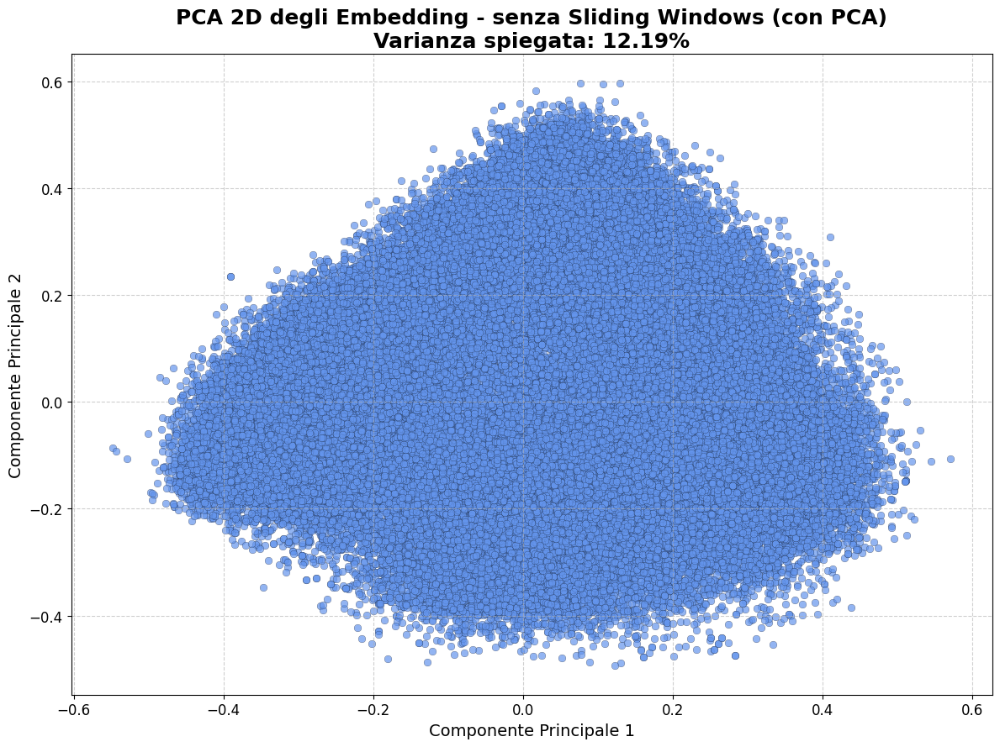


[Riduzione UMAP] - senza Sliding Windows (con PCA)...


/usr/local/lib/python3.11/dist-packages/umap/umap_.py:1952: UserWarning: n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.
  warn(


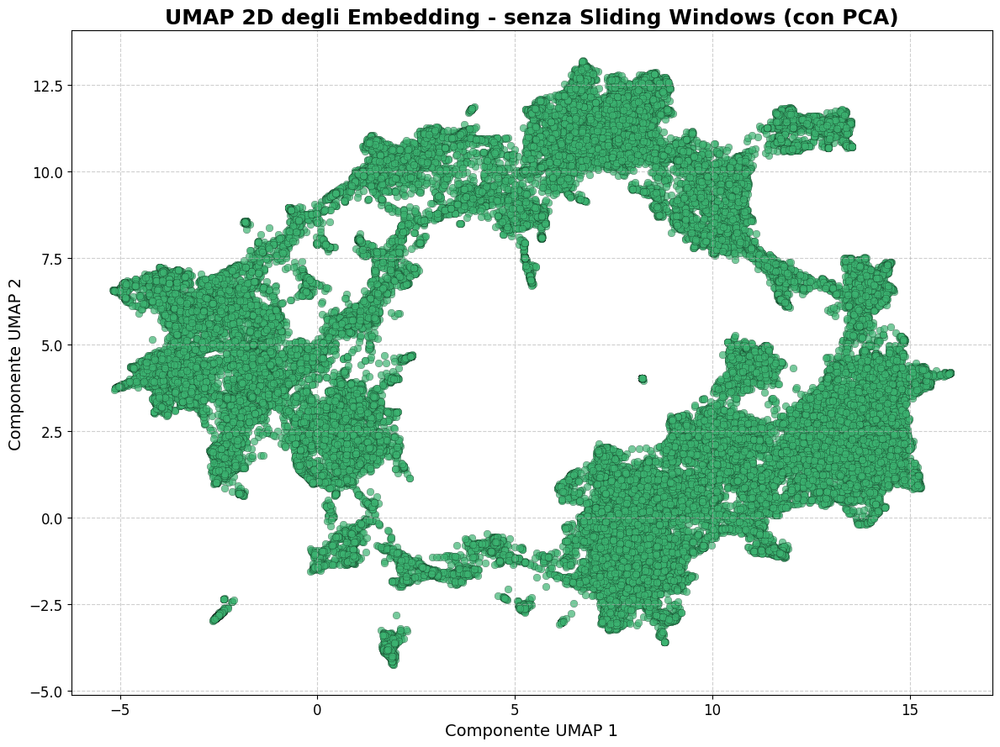

In [ ]:
embeddings_no_sliding_pca, n_pca_sliding = reduce_with_pca(embeddings_no_sliding)
visualize_embeddings(embeddings_no_sliding_pca, "senza Sliding Windows (con PCA)")

In [ ]:
results_no_sliding_pca, best_params_no_sliding_pca, scaler_no_sliding_pca = grid_search_dbscan(embeddings_no_sliding_pca, eps_range, min_samples_range)
dbscan_no_sliding_pca = DBSCAN(eps=best_params_no_sliding_pca['eps'], min_samples=best_params_no_sliding_pca['min_samples'])
labels_no_sliding_pca = dbscan_no_sliding_pca.fit_predict(scaler_no_sliding_pca.transform(embeddings_no_sliding_pca))


Esecuzione Grid Search per DBSCAN...


  0%|          | 0/15 [00:00<?, ?it/s]


Risultati della Grid Search:
   eps  min_samples  n_clusters  noise_proportion  silhouette
0  0.1            5           0               1.0         NaN
1  0.1           25           0               1.0         NaN
2  0.1           50           0               1.0         NaN
3  0.1           70           0               1.0         NaN
4  0.1          100           0               1.0         NaN
5  0.7            5           0               1.0         NaN
6  0.7           25           0               1.0         NaN
7  0.7           50           0               1.0         NaN
8  0.7           70           0               1.0         NaN
9  0.7          100           0               1.0         NaN

Nessun parametro valido trovato. Utilizziamo parametri predefiniti.


/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1458: RuntimeWarning: invalid value encountered in greater
  has_large_values = (abs_vals > 1e6).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in less
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()
/usr/local/lib/python3.11/dist-packages/pandas/io/formats/format.py:1459: RuntimeWarning: invalid value encountered in greater
  has_small_values = ((abs_vals < 10 ** (-self.digits)) & (abs_vals > 0)).any()


/tmp/ipykernel_13/2691697294.py:182: UserWarning: The palette list has more values (100000) than needed (1), which may not be intended.
  sns.scatterplot(


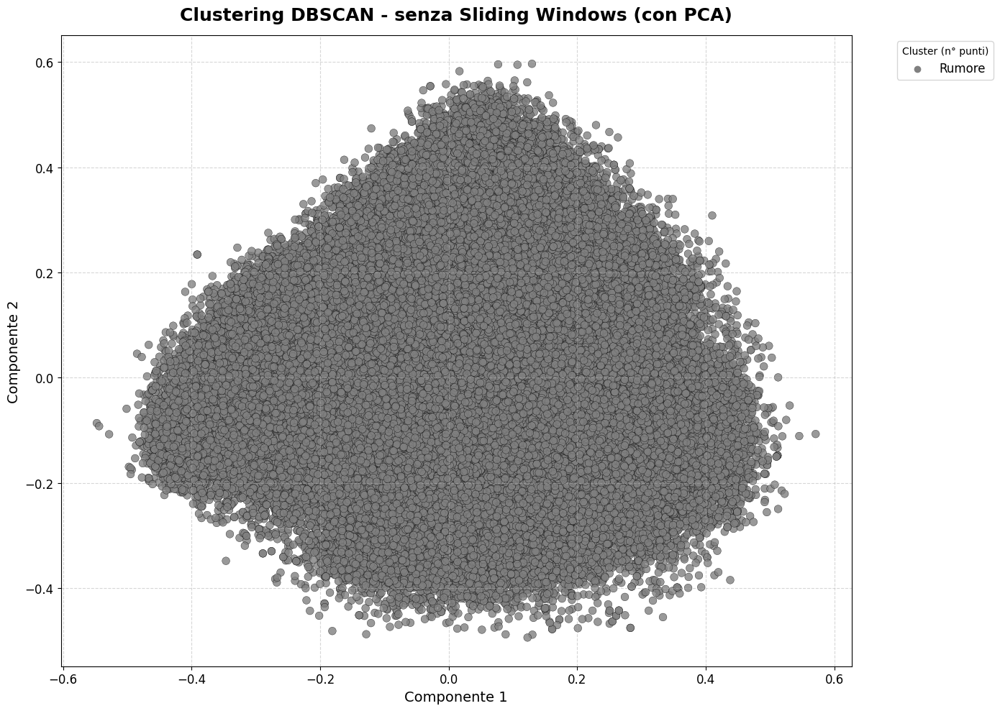


Distribuzione dei punti nei cluster:
Rumore: 100000 punti (100.00%)


In [ ]:
visualize_clusters(embeddings_no_sliding_pca, labels_no_sliding_pca, "senza Sliding Windows (con PCA)")